# Face Generation with GAN
In this project, I will use generative adversarial networks to generate new images of faces.
### Get the Data
I will use two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex, I want to test the neural network on MNIST before CelebA. Running the GANs on MNIST will allow to assess the network performance.

In [1]:
data_dir = './data'

import helper

## Data exploration
### MNIST
The [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits.

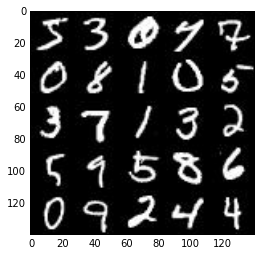

In [15]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.

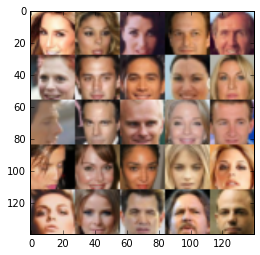

In [3]:
show_n_images = 25

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
Build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('GPU found! Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
GPU found! Default GPU Device: /gpu:0


### Input
Implementation of the `model_inputs` function to create TF Placeholders for the Neural Network.
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
  
    # Placeholders
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    return input_real, input_z, learning_rate

tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implementation of the `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.

In [8]:
def discriminator(images, reuse=False):

    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse): 
        # 28x28x3 -> 14x14x128
        x1 = tf.layers.conv2d(images, 64, 4, strides = 2, padding='same', 
                              kernel_initializer = tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(alpha * x1, x1)
        relu1 = tf.nn.dropout(relu1, keep_prob=0.75)
        # 14x14x128 -> 7x7x256
        x2 = tf.layers.conv2d(relu1, 256, 4, strides = 2, padding='same',
                              kernel_initializer = tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        relu2 = tf.nn.dropout(relu2, keep_prob=0.75)
        # 7x7x256 to 4x4x512
        x3 = tf.layers.conv2d(relu2, 512, 4, strides = 2, padding='same', 
                              kernel_initializer = tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        relu3 = tf.nn.dropout(relu3, keep_prob=0.75)
        # Flatten layer
        flat = tf.reshape(relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits

tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implementation of the `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused.

In [9]:
def generator(z, out_channel_dim, is_train=True):

    if is_train == True:
        reuse = False
    if is_train != True:
        reuse = True
        
    with tf.variable_scope('generator', reuse=reuse):
        alpha = 0.1
        x1 = tf.layers.dense(z, 4*4*512)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        # --> 4x4x512
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob=0.75)
        #4x4x512 -> 7x7x256
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid',
                                       kernel_initializer = tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob=0.75)
        #7x7x256 -> 14x14*128
        x3 = tf.layers.conv2d_transpose(x2, 56, 4, strides=2, padding='same',
                                       kernel_initializer = tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)  
        x3 = tf.nn.dropout(x3, keep_prob=0.75)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 4, strides=2, padding='same')
        out = tf.tanh(logits)

    return out

tests.test_generator(generator, tf)

Tests Passed


### Loss
Implementation of the `model_loss` function to build the GANs for training and calculate the loss by using the following implemented functions:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):

    smooth = 0.1
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels= 
                                                                        tf.ones_like(d_logits_real)* (1 - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=
                                                                        tf.zeros_like(d_logits_real)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=
                                                                   tf.ones_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implementation of the `model_opt` function to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):

    all_vars = tf.trainable_variables()
    d_vars = [var for var in all_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in all_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list = d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list = g_vars)
    
    return d_train_opt, g_train_opt

tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Function to show the current output of the generator during training. It will help to determine how well the GANs is training.

In [12]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):

    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

## Train
Implementation of `train` to build and train the GANs by using the implemented functions:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [13]:
import helper
mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
print(mnist_dataset.shape)
print(mnist_dataset.shape[2])
print(mnist_dataset.image_mode)
data_image_mode = mnist_dataset.image_mode
if data_image_mode == 'RGB':
    out_shape = 3
if data_image_mode == 'L':
    out_shape = 1

# Check shape
print(out_shape)

(0, 28, 28, 1)
28
L
1


### Scale function

In [13]:
def scale(x, feature_range=(-1, 1)):
    x = ((x - x.min())/(255 - x.min()))
    minS, maxS = feature_range
    x = x * (maxS - minS) + minS
    return x

In [14]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):

    # Build the model
    if data_image_mode == 'RGB':
        out_shape = 3
    if data_image_mode == 'L':
        out_shape = 1
        
    samples = []
    losses = []
        
    input_real, input_z, _ = model_inputs(data_shape[2], data_shape[2], out_shape, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, out_shape)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print("learning rate: {}...".format(learning_rate))

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):

                steps += 1

                batch_images = batch_images*2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                
                # two times --> generator optimization
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real:batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % 50 == 0:
                    print("Epoch {}/ step {}".format(epoch_i, steps))
                    print("train loss d: {}/ train loss g {}".format(train_loss_d, train_loss_g))
                
                if steps % 100 == 0:
                    samples_gen = show_generator_output(sess, 25, input_z, out_shape, data_image_mode)
                    samples.append(samples_gen)
                    
                    
    return losses, samples
                

### MNIST
Test the GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.

learning rate: 0.0002...
Epoch 0/ step 50
train loss d: 2.830073833465576/ train loss g 0.2398681938648224
Epoch 0/ step 100
train loss d: 0.5797981023788452/ train loss g 2.7823264598846436


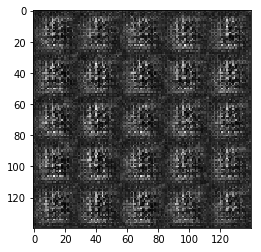

Epoch 0/ step 150
train loss d: 2.0870940685272217/ train loss g 0.4744024872779846
Epoch 0/ step 200
train loss d: 1.3578770160675049/ train loss g 0.9856234192848206


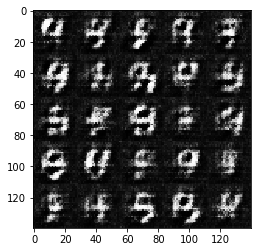

Epoch 0/ step 250
train loss d: 1.0801007747650146/ train loss g 1.2672686576843262
Epoch 0/ step 300
train loss d: 1.1065183877944946/ train loss g 1.1676526069641113


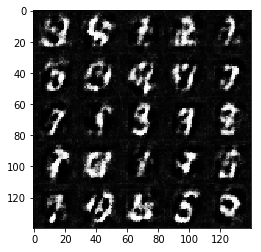

Epoch 0/ step 350
train loss d: 1.1200828552246094/ train loss g 1.4869136810302734
Epoch 0/ step 400
train loss d: 1.59331476688385/ train loss g 0.5186790227890015


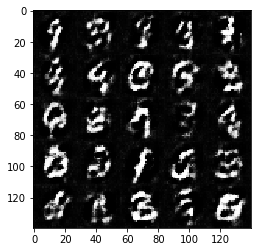

Epoch 0/ step 450
train loss d: 1.0518014430999756/ train loss g 1.3600609302520752
Epoch 0/ step 500
train loss d: 1.0814268589019775/ train loss g 1.4853193759918213


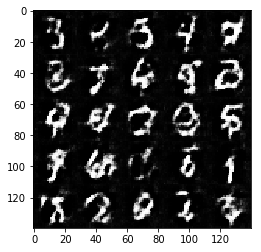

Epoch 0/ step 550
train loss d: 1.3800324201583862/ train loss g 2.053170919418335
Epoch 0/ step 600
train loss d: 1.0766069889068604/ train loss g 1.002943754196167


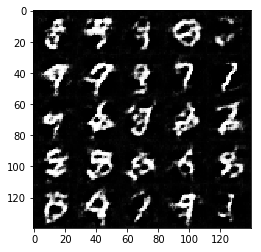

Epoch 0/ step 650
train loss d: 1.3056644201278687/ train loss g 1.6083779335021973
Epoch 0/ step 700
train loss d: 1.1988732814788818/ train loss g 1.6485278606414795


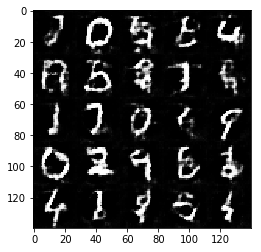

Epoch 0/ step 750
train loss d: 1.1133066415786743/ train loss g 0.8613729476928711
Epoch 0/ step 800
train loss d: 1.4030940532684326/ train loss g 0.5877043604850769


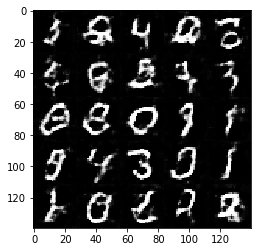

Epoch 0/ step 850
train loss d: 1.0406376123428345/ train loss g 1.1243901252746582
Epoch 0/ step 900
train loss d: 1.2598974704742432/ train loss g 1.3730190992355347


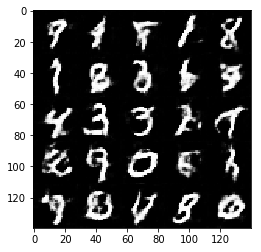

Epoch 1/ step 950
train loss d: 1.2422535419464111/ train loss g 1.1867406368255615
Epoch 1/ step 1000
train loss d: 1.1319198608398438/ train loss g 1.0770550966262817


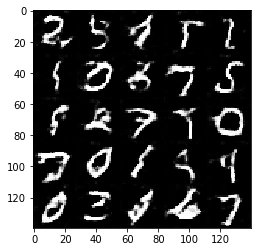

Epoch 1/ step 1050
train loss d: 1.3013827800750732/ train loss g 2.0168581008911133
Epoch 1/ step 1100
train loss d: 1.396435022354126/ train loss g 0.5824739933013916


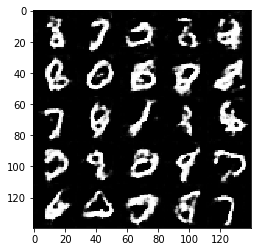

Epoch 1/ step 1150
train loss d: 1.2556231021881104/ train loss g 0.5806779861450195
Epoch 1/ step 1200
train loss d: 1.1176435947418213/ train loss g 0.9955497980117798


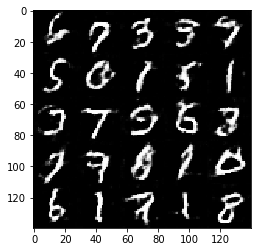

Epoch 1/ step 1250
train loss d: 1.1700812578201294/ train loss g 1.3833799362182617
Epoch 1/ step 1300
train loss d: 1.36110258102417/ train loss g 1.7537472248077393


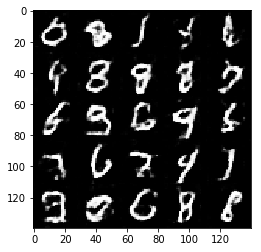

Epoch 1/ step 1350
train loss d: 1.1174976825714111/ train loss g 1.11842679977417
Epoch 1/ step 1400
train loss d: 2.071282148361206/ train loss g 2.978358268737793


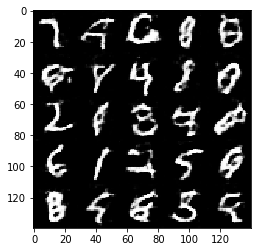

Epoch 1/ step 1450
train loss d: 1.1075122356414795/ train loss g 0.9106613397598267
Epoch 1/ step 1500
train loss d: 1.2111916542053223/ train loss g 2.198118209838867


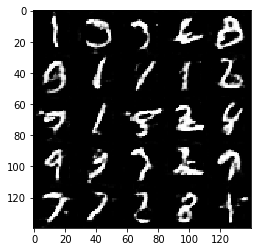

Epoch 1/ step 1550
train loss d: 1.0130257606506348/ train loss g 1.1611956357955933
Epoch 1/ step 1600
train loss d: 1.3295303583145142/ train loss g 0.7121860980987549


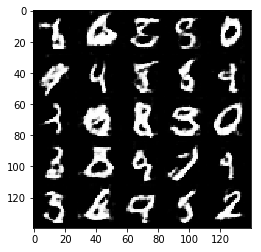

Epoch 1/ step 1650
train loss d: 1.241391658782959/ train loss g 1.3664121627807617
Epoch 1/ step 1700
train loss d: 1.297403335571289/ train loss g 0.6201536059379578


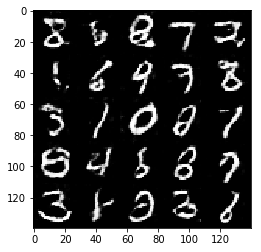

Epoch 1/ step 1750
train loss d: 1.1218836307525635/ train loss g 1.2388169765472412
Epoch 1/ step 1800
train loss d: 1.2948659658432007/ train loss g 0.8146058917045593


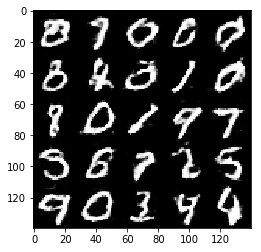

Epoch 1/ step 1850
train loss d: 1.1659460067749023/ train loss g 1.1660637855529785


In [15]:
batch_size = 64
z_dim = 128
learning_rate = 0.0002
beta1 = 0.4

epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run the GANs on CelebA.

In [12]:
celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
print(celeba_dataset.shape)

(202599, 28, 28, 3)


learning rate: 0.00025...
Epoch 0/ step 50
train loss d: 1.1770029067993164/ train loss g 2.6626360416412354
Epoch 0/ step 100
train loss d: 1.0784140825271606/ train loss g 1.0334830284118652


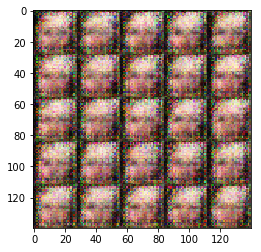

Epoch 0/ step 150
train loss d: 0.5521677732467651/ train loss g 3.0812578201293945
Epoch 0/ step 200
train loss d: 0.4538869857788086/ train loss g 3.5619735717773438


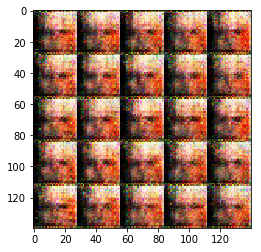

Epoch 0/ step 250
train loss d: 0.45845770835876465/ train loss g 2.856992483139038
Epoch 0/ step 300
train loss d: 1.0644257068634033/ train loss g 0.9362523555755615


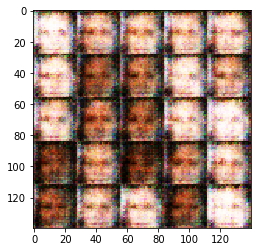

Epoch 0/ step 350
train loss d: 1.4981844425201416/ train loss g 0.6069217324256897
Epoch 0/ step 400
train loss d: 1.0207489728927612/ train loss g 4.167747497558594


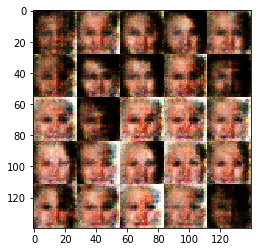

Epoch 0/ step 450
train loss d: 0.9884589910507202/ train loss g 2.4599263668060303
Epoch 0/ step 500
train loss d: 1.4903581142425537/ train loss g 0.5507508516311646


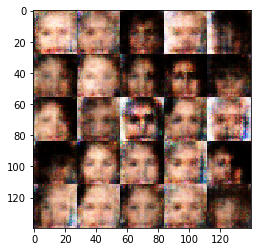

Epoch 0/ step 550
train loss d: 1.476939082145691/ train loss g 0.7552926540374756
Epoch 0/ step 600
train loss d: 1.7560348510742188/ train loss g 0.6506311297416687


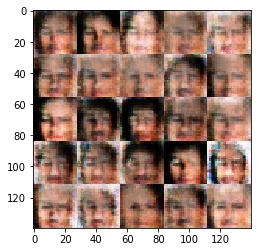

Epoch 0/ step 650
train loss d: 1.4751856327056885/ train loss g 0.8745425939559937
Epoch 0/ step 700
train loss d: 1.3057477474212646/ train loss g 0.9252846837043762


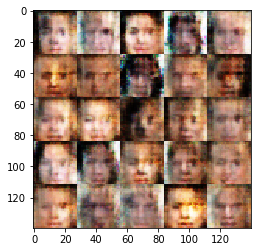

Epoch 0/ step 750
train loss d: 1.4424984455108643/ train loss g 1.0875694751739502
Epoch 0/ step 800
train loss d: 1.4922730922698975/ train loss g 0.7370926141738892


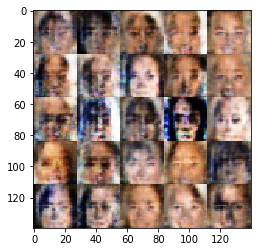

Epoch 0/ step 850
train loss d: 1.424710750579834/ train loss g 0.8609873056411743
Epoch 0/ step 900
train loss d: 1.4131934642791748/ train loss g 1.0836023092269897


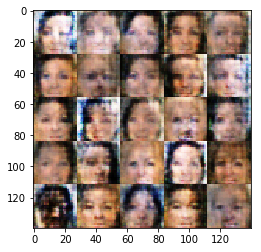

Epoch 0/ step 950
train loss d: 1.2715706825256348/ train loss g 0.9304590225219727
Epoch 0/ step 1000
train loss d: 1.2928880453109741/ train loss g 1.0162644386291504


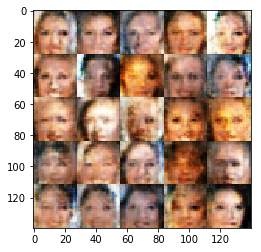

Epoch 0/ step 1050
train loss d: 1.5756207704544067/ train loss g 0.8340309858322144
Epoch 0/ step 1100
train loss d: 1.4538830518722534/ train loss g 0.6554794311523438


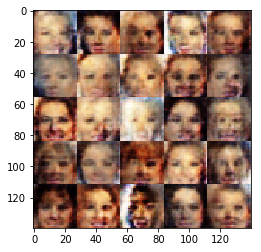

Epoch 0/ step 1150
train loss d: 1.3110039234161377/ train loss g 0.9218900203704834
Epoch 0/ step 1200
train loss d: 1.3840850591659546/ train loss g 0.7085378170013428


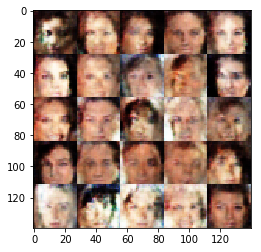

Epoch 0/ step 1250
train loss d: 1.2493252754211426/ train loss g 0.7602618336677551
Epoch 0/ step 1300
train loss d: 1.3350399732589722/ train loss g 0.8334139585494995


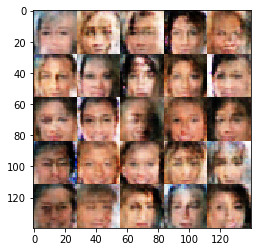

Epoch 0/ step 1350
train loss d: 1.4099757671356201/ train loss g 0.6542612314224243
Epoch 0/ step 1400
train loss d: 1.2929561138153076/ train loss g 0.9618139863014221


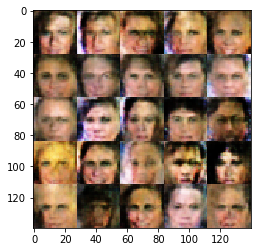

Epoch 0/ step 1450
train loss d: 1.3456517457962036/ train loss g 0.9049097895622253
Epoch 0/ step 1500
train loss d: 1.36403489112854/ train loss g 0.6838963627815247


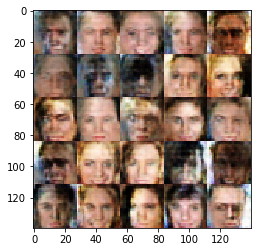

Epoch 0/ step 1550
train loss d: 1.296270489692688/ train loss g 0.720555305480957
Epoch 0/ step 1600
train loss d: 1.4525792598724365/ train loss g 0.7164139747619629


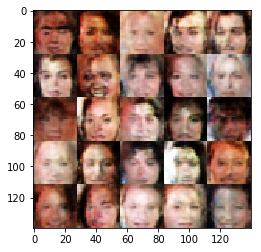

Epoch 0/ step 1650
train loss d: 1.2215673923492432/ train loss g 1.014812707901001
Epoch 0/ step 1700
train loss d: 1.4515066146850586/ train loss g 0.8242399096488953


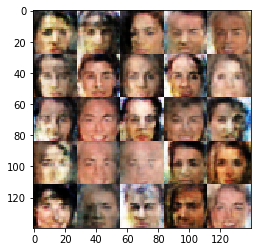

Epoch 0/ step 1750
train loss d: 1.3631700277328491/ train loss g 0.9570955038070679
Epoch 0/ step 1800
train loss d: 1.3648003339767456/ train loss g 1.0386232137680054


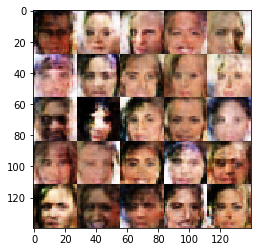

Epoch 0/ step 1850
train loss d: 1.418123483657837/ train loss g 0.7280579209327698
Epoch 0/ step 1900
train loss d: 1.2793188095092773/ train loss g 0.9947296380996704


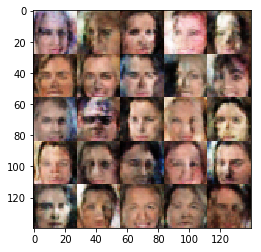

Epoch 0/ step 1950
train loss d: 1.3071815967559814/ train loss g 0.7432700395584106
Epoch 0/ step 2000
train loss d: 1.2736656665802002/ train loss g 0.8174927234649658


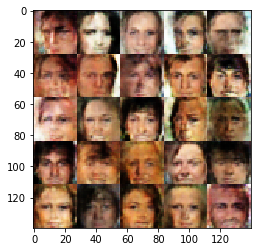

Epoch 0/ step 2050
train loss d: 1.2624872922897339/ train loss g 0.7482810020446777
Epoch 0/ step 2100
train loss d: 1.4423441886901855/ train loss g 0.5949591398239136


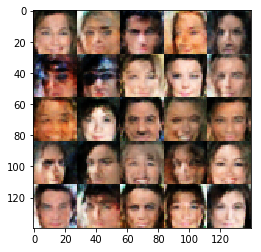

Epoch 0/ step 2150
train loss d: 1.3574745655059814/ train loss g 1.2361855506896973
Epoch 0/ step 2200
train loss d: 1.390504240989685/ train loss g 1.1526529788970947


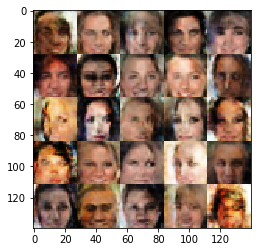

Epoch 0/ step 2250
train loss d: 1.4512172937393188/ train loss g 0.5855171084403992
Epoch 0/ step 2300
train loss d: 1.3955225944519043/ train loss g 0.7747259140014648


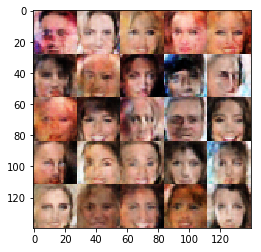

Epoch 0/ step 2350
train loss d: 1.3852810859680176/ train loss g 1.0838873386383057
Epoch 0/ step 2400
train loss d: 1.4295499324798584/ train loss g 0.8209474086761475


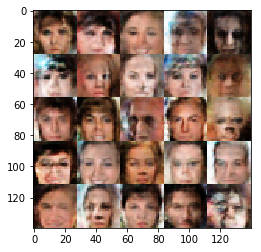

Epoch 0/ step 2450
train loss d: 1.3647403717041016/ train loss g 0.6272944211959839
Epoch 0/ step 2500
train loss d: 1.4763216972351074/ train loss g 0.9388994574546814


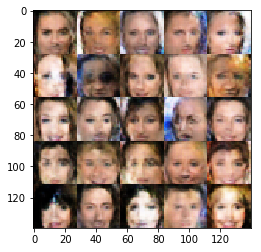

Epoch 0/ step 2550
train loss d: 1.340507984161377/ train loss g 0.7788578867912292
Epoch 0/ step 2600
train loss d: 1.3557223081588745/ train loss g 0.67229163646698


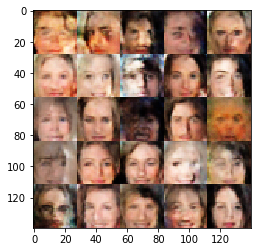

Epoch 0/ step 2650
train loss d: 1.169769287109375/ train loss g 0.8488832712173462
Epoch 0/ step 2700
train loss d: 1.2644038200378418/ train loss g 0.927100658416748


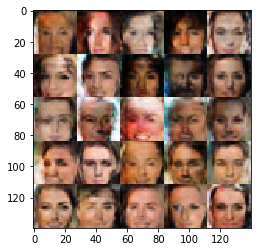

Epoch 0/ step 2750
train loss d: 1.273858904838562/ train loss g 0.7985036373138428
Epoch 0/ step 2800
train loss d: 1.3752696514129639/ train loss g 0.7002583742141724


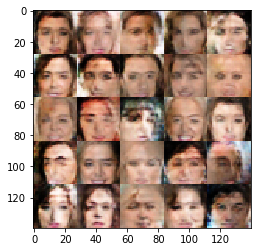

Epoch 0/ step 2850
train loss d: 1.467934489250183/ train loss g 0.940625786781311
Epoch 0/ step 2900
train loss d: 1.32438325881958/ train loss g 1.1363999843597412


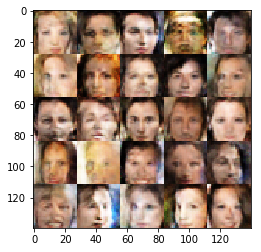

Epoch 0/ step 2950
train loss d: 1.0689393281936646/ train loss g 1.086002230644226
Epoch 0/ step 3000
train loss d: 1.2692601680755615/ train loss g 1.2042217254638672


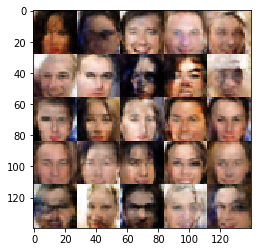

Epoch 0/ step 3050
train loss d: 1.3468658924102783/ train loss g 0.7885072231292725
Epoch 0/ step 3100
train loss d: 1.2281941175460815/ train loss g 0.9408915638923645


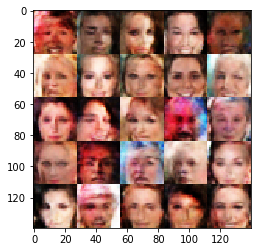

Epoch 0/ step 3150
train loss d: 1.195219874382019/ train loss g 0.9600858688354492
Epoch 0/ step 3200
train loss d: 1.3635096549987793/ train loss g 0.7106032371520996


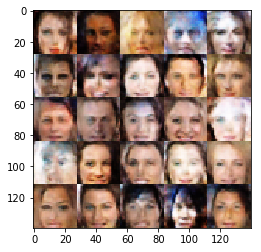

Epoch 0/ step 3250
train loss d: 1.4027304649353027/ train loss g 0.5937700271606445
Epoch 0/ step 3300
train loss d: 1.1594035625457764/ train loss g 0.9749706983566284


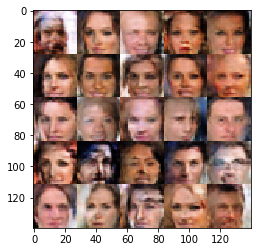

Epoch 0/ step 3350
train loss d: 1.2051477432250977/ train loss g 0.9899851679801941
Epoch 0/ step 3400
train loss d: 1.2630884647369385/ train loss g 0.790523886680603


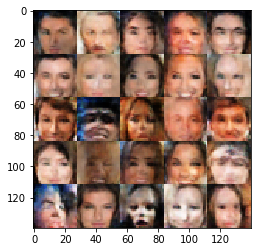

Epoch 0/ step 3450
train loss d: 1.2042615413665771/ train loss g 0.9124559164047241
Epoch 0/ step 3500
train loss d: 1.153728723526001/ train loss g 0.9059964418411255


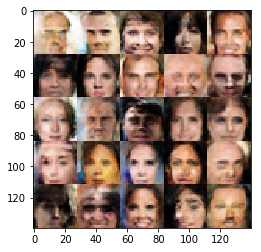

Epoch 0/ step 3550
train loss d: 1.2878384590148926/ train loss g 0.7186498641967773
Epoch 0/ step 3600
train loss d: 1.3586020469665527/ train loss g 0.7655962109565735


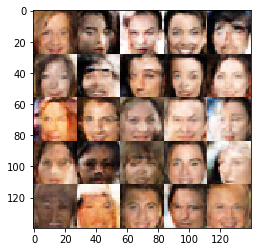

Epoch 0/ step 3650
train loss d: 1.2363414764404297/ train loss g 0.940609872341156
Epoch 0/ step 3700
train loss d: 1.2461296319961548/ train loss g 0.8388252854347229


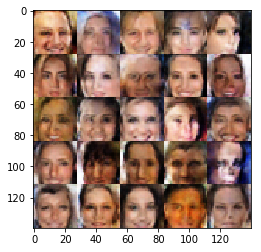

Epoch 0/ step 3750
train loss d: 1.320928692817688/ train loss g 0.9882359504699707
Epoch 0/ step 3800
train loss d: 1.2756645679473877/ train loss g 1.2282676696777344


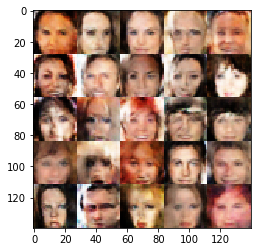

Epoch 0/ step 3850
train loss d: 1.4333161115646362/ train loss g 0.785162091255188
Epoch 0/ step 3900
train loss d: 1.329646348953247/ train loss g 1.280847430229187


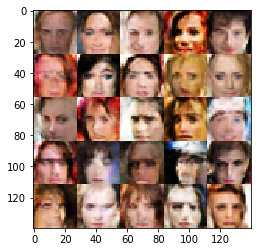

Epoch 0/ step 3950
train loss d: 1.236223816871643/ train loss g 0.8914800882339478
Epoch 0/ step 4000
train loss d: 1.3234124183654785/ train loss g 0.7752232551574707


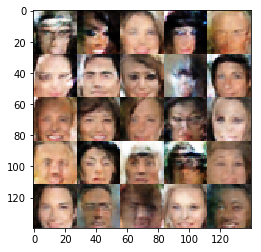

Epoch 0/ step 4050
train loss d: 1.343339443206787/ train loss g 0.7193993330001831
Epoch 0/ step 4100
train loss d: 1.2866376638412476/ train loss g 0.6946096420288086


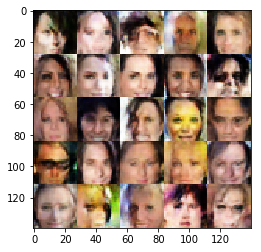

Epoch 0/ step 4150
train loss d: 1.3529936075210571/ train loss g 1.1109477281570435
Epoch 0/ step 4200
train loss d: 1.282364010810852/ train loss g 0.6358487606048584


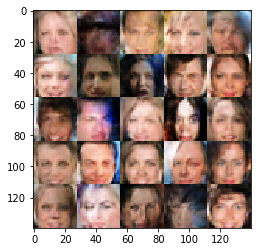

Epoch 0/ step 4250
train loss d: 0.9997305274009705/ train loss g 1.2550874948501587
Epoch 0/ step 4300
train loss d: 1.3306834697723389/ train loss g 0.6797981858253479


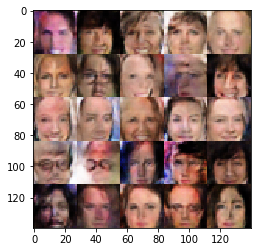

Epoch 0/ step 4350
train loss d: 1.3562633991241455/ train loss g 0.564638614654541
Epoch 0/ step 4400
train loss d: 1.4305652379989624/ train loss g 0.5280627012252808


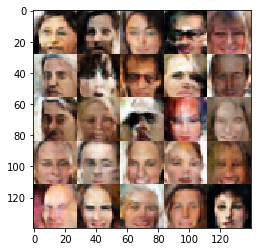

Epoch 0/ step 4450
train loss d: 1.4626094102859497/ train loss g 0.4997629225254059
Epoch 0/ step 4500
train loss d: 1.2109049558639526/ train loss g 0.9064053297042847


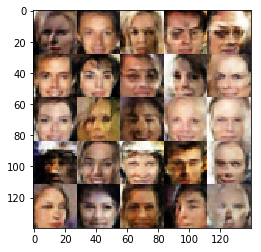

Epoch 0/ step 4550
train loss d: 1.2261170148849487/ train loss g 1.0109741687774658
Epoch 0/ step 4600
train loss d: 1.0210967063903809/ train loss g 1.0040019750595093


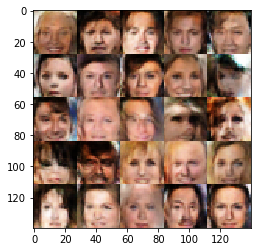

Epoch 0/ step 4650
train loss d: 1.3378703594207764/ train loss g 0.8519948720932007
Epoch 0/ step 4700
train loss d: 1.276818037033081/ train loss g 1.2646877765655518


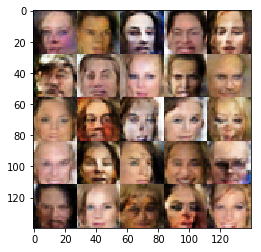

Epoch 0/ step 4750
train loss d: 1.4010870456695557/ train loss g 0.8716330528259277
Epoch 0/ step 4800
train loss d: 1.238686203956604/ train loss g 0.7378324866294861


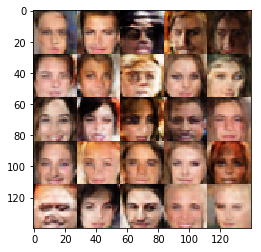

Epoch 0/ step 4850
train loss d: 1.1003024578094482/ train loss g 1.0493216514587402
Epoch 0/ step 4900
train loss d: 1.1807870864868164/ train loss g 0.7812818884849548


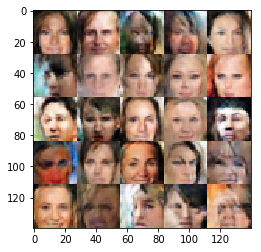

Epoch 0/ step 4950
train loss d: 1.3530020713806152/ train loss g 0.755728006362915
Epoch 0/ step 5000
train loss d: 1.2491635084152222/ train loss g 1.2660759687423706


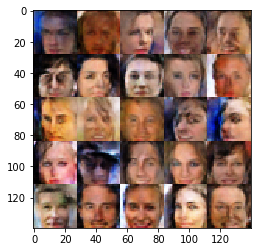

Epoch 0/ step 5050
train loss d: 1.3512954711914062/ train loss g 1.3091315031051636
Epoch 0/ step 5100
train loss d: 1.2272424697875977/ train loss g 1.2415287494659424


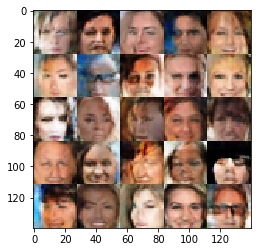

Epoch 0/ step 5150
train loss d: 1.4354311227798462/ train loss g 0.49691101908683777
Epoch 0/ step 5200
train loss d: 1.1066879034042358/ train loss g 0.9723125696182251


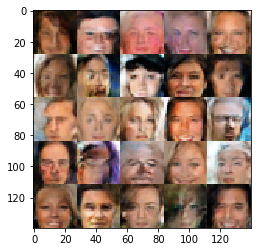

Epoch 0/ step 5250
train loss d: 1.155245304107666/ train loss g 1.5948865413665771
Epoch 0/ step 5300
train loss d: 1.2468019723892212/ train loss g 0.8408458232879639


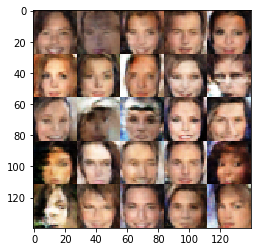

Epoch 0/ step 5350
train loss d: 1.2338448762893677/ train loss g 1.054050326347351
Epoch 0/ step 5400
train loss d: 1.1396830081939697/ train loss g 1.0303459167480469


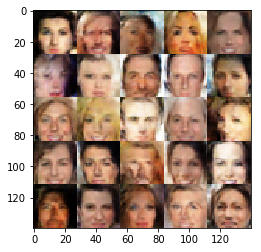

Epoch 0/ step 5450
train loss d: 1.2373889684677124/ train loss g 0.9043947458267212
Epoch 0/ step 5500
train loss d: 1.2628173828125/ train loss g 1.1404218673706055


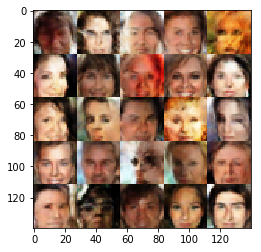

Epoch 0/ step 5550
train loss d: 1.300917625427246/ train loss g 0.766864538192749
Epoch 0/ step 5600
train loss d: 1.1405789852142334/ train loss g 1.1072230339050293


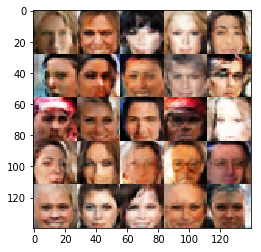

Epoch 0/ step 5650
train loss d: 1.2286468744277954/ train loss g 0.7497318983078003
Epoch 0/ step 5700
train loss d: 1.1683181524276733/ train loss g 1.2384862899780273


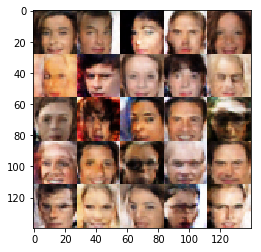

Epoch 0/ step 5750
train loss d: 1.2653350830078125/ train loss g 1.266300916671753
Epoch 0/ step 5800
train loss d: 1.0574418306350708/ train loss g 1.083956003189087


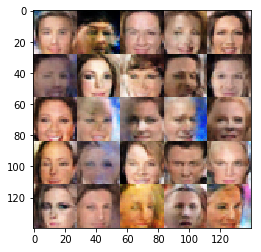

Epoch 0/ step 5850
train loss d: 1.2740473747253418/ train loss g 0.755560040473938
Epoch 0/ step 5900
train loss d: 1.1436666250228882/ train loss g 1.1336352825164795


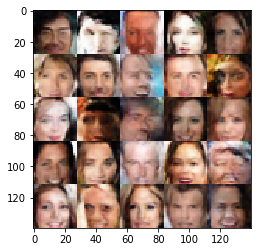

Epoch 0/ step 5950
train loss d: 1.2448244094848633/ train loss g 1.145809292793274
Epoch 0/ step 6000
train loss d: 1.1631417274475098/ train loss g 0.9467195272445679


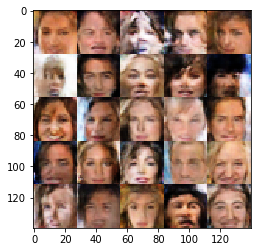

Epoch 0/ step 6050
train loss d: 1.0453071594238281/ train loss g 1.0379456281661987
Epoch 0/ step 6100
train loss d: 1.1227842569351196/ train loss g 1.0497688055038452


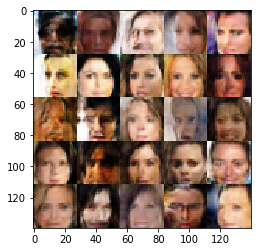

Epoch 0/ step 6150
train loss d: 1.1290273666381836/ train loss g 0.9584856033325195
Epoch 0/ step 6200
train loss d: 1.308348298072815/ train loss g 0.729475736618042


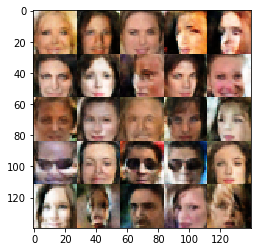

Epoch 0/ step 6250
train loss d: 1.1209380626678467/ train loss g 0.8890841007232666
Epoch 0/ step 6300
train loss d: 1.2544654607772827/ train loss g 1.1602013111114502


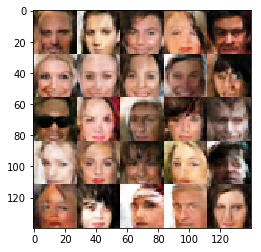

Epoch 1/ step 6350
train loss d: 1.2332446575164795/ train loss g 0.8914003372192383
Epoch 1/ step 6400
train loss d: 1.2889952659606934/ train loss g 1.251781940460205


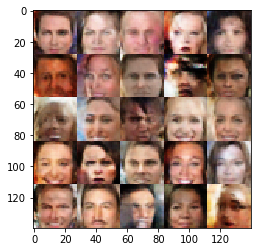

Epoch 1/ step 6450
train loss d: 1.2915681600570679/ train loss g 0.8869325518608093
Epoch 1/ step 6500
train loss d: 1.3553061485290527/ train loss g 1.0947933197021484


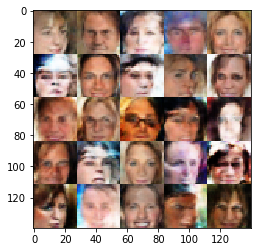

Epoch 1/ step 6550
train loss d: 1.3148698806762695/ train loss g 0.690211296081543
Epoch 1/ step 6600
train loss d: 1.217384696006775/ train loss g 1.0656623840332031


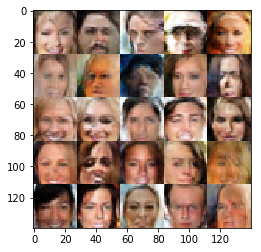

Epoch 1/ step 6650
train loss d: 1.1286370754241943/ train loss g 1.0323498249053955
Epoch 1/ step 6700
train loss d: 0.9989744424819946/ train loss g 1.2608317136764526


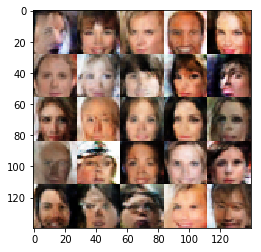

Epoch 1/ step 6750
train loss d: 1.0425517559051514/ train loss g 1.1055951118469238
Epoch 1/ step 6800
train loss d: 1.0292237997055054/ train loss g 1.0673909187316895


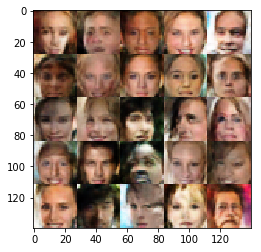

Epoch 1/ step 6850
train loss d: 0.9695690870285034/ train loss g 1.255494475364685
Epoch 1/ step 6900
train loss d: 1.0587297677993774/ train loss g 1.1470563411712646


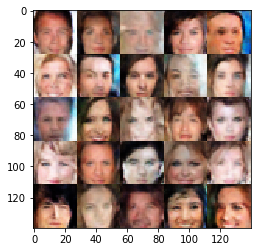

Epoch 1/ step 6950
train loss d: 1.146775484085083/ train loss g 0.7623627185821533
Epoch 1/ step 7000
train loss d: 1.1257100105285645/ train loss g 0.9325774312019348


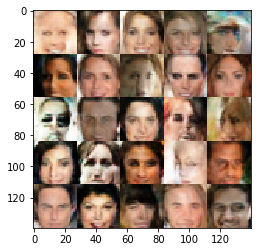

Epoch 1/ step 7050
train loss d: 1.1495108604431152/ train loss g 1.2692816257476807
Epoch 1/ step 7100
train loss d: 0.971976101398468/ train loss g 1.2736713886260986


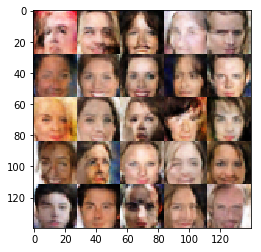

Epoch 1/ step 7150
train loss d: 1.2179944515228271/ train loss g 1.2945345640182495
Epoch 1/ step 7200
train loss d: 1.1038368940353394/ train loss g 1.3894801139831543


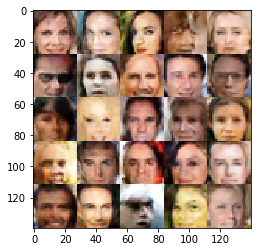

Epoch 1/ step 7250
train loss d: 1.151566982269287/ train loss g 0.7496865391731262
Epoch 1/ step 7300
train loss d: 1.0690525770187378/ train loss g 1.2181720733642578


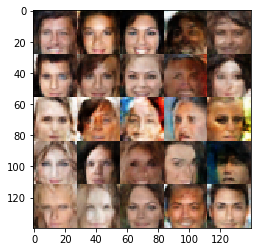

Epoch 1/ step 7350
train loss d: 1.2177460193634033/ train loss g 0.9597187638282776
Epoch 1/ step 7400
train loss d: 1.0787701606750488/ train loss g 1.1350045204162598


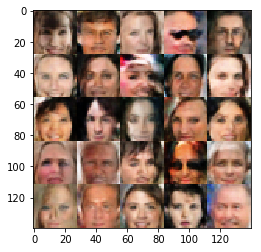

Epoch 1/ step 7450
train loss d: 0.9977303743362427/ train loss g 0.8666648864746094
Epoch 1/ step 7500
train loss d: 1.1343952417373657/ train loss g 0.9426469802856445


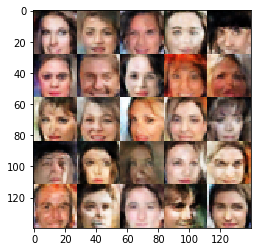

Epoch 1/ step 7550
train loss d: 1.298740267753601/ train loss g 0.6924248933792114
Epoch 1/ step 7600
train loss d: 1.2253789901733398/ train loss g 0.7433725595474243


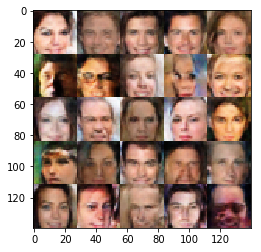

Epoch 1/ step 7650
train loss d: 1.2328152656555176/ train loss g 0.8454254865646362
Epoch 1/ step 7700
train loss d: 1.1236599683761597/ train loss g 1.2777531147003174


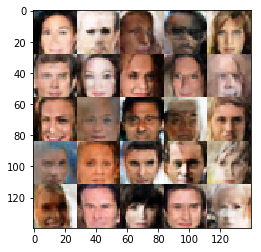

Epoch 1/ step 7750
train loss d: 1.0385968685150146/ train loss g 0.9044084548950195
Epoch 1/ step 7800
train loss d: 1.081547498703003/ train loss g 1.8436946868896484


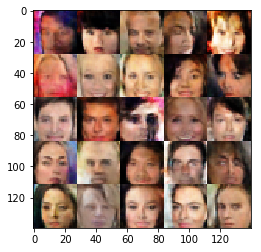

Epoch 1/ step 7850
train loss d: 1.2372934818267822/ train loss g 0.845165491104126
Epoch 1/ step 7900
train loss d: 1.072629451751709/ train loss g 1.2627836465835571


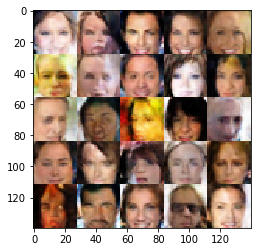

Epoch 1/ step 7950
train loss d: 0.9734886884689331/ train loss g 1.2004884481430054
Epoch 1/ step 8000
train loss d: 1.0294504165649414/ train loss g 1.7687608003616333


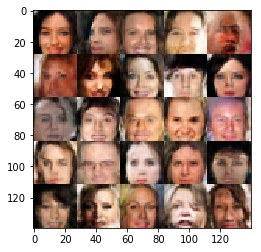

Epoch 1/ step 8050
train loss d: 1.2068432569503784/ train loss g 1.0478298664093018
Epoch 1/ step 8100
train loss d: 1.4946224689483643/ train loss g 0.9296577572822571


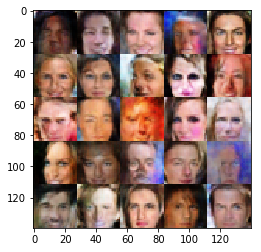

Epoch 1/ step 8150
train loss d: 1.3277478218078613/ train loss g 0.781693696975708
Epoch 1/ step 8200
train loss d: 1.1127021312713623/ train loss g 1.5284678936004639


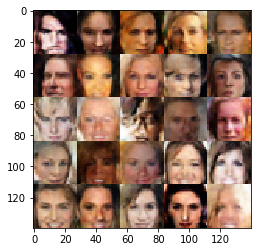

Epoch 1/ step 8250
train loss d: 1.0780365467071533/ train loss g 1.0902676582336426
Epoch 1/ step 8300
train loss d: 1.2263261079788208/ train loss g 0.7971433401107788


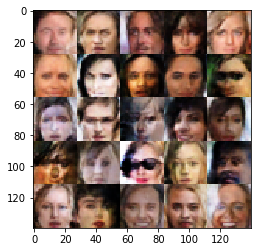

Epoch 1/ step 8350
train loss d: 0.9207583665847778/ train loss g 1.5027499198913574
Epoch 1/ step 8400
train loss d: 1.2283029556274414/ train loss g 1.6390480995178223


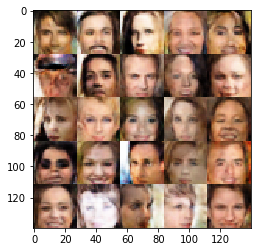

Epoch 1/ step 8450
train loss d: 1.2962584495544434/ train loss g 0.9178051948547363
Epoch 1/ step 8500
train loss d: 1.0857815742492676/ train loss g 1.139693260192871


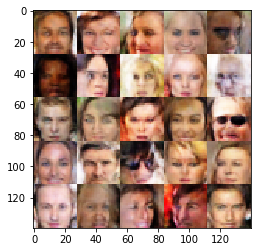

Epoch 1/ step 8550
train loss d: 1.1602792739868164/ train loss g 0.5319945812225342
Epoch 1/ step 8600
train loss d: 1.1993319988250732/ train loss g 1.8433476686477661


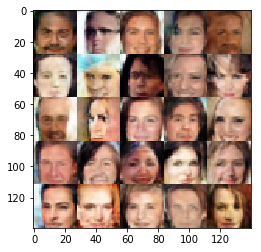

Epoch 1/ step 8650
train loss d: 1.3779571056365967/ train loss g 0.6167410612106323
Epoch 1/ step 8700
train loss d: 1.0325591564178467/ train loss g 0.7424788475036621


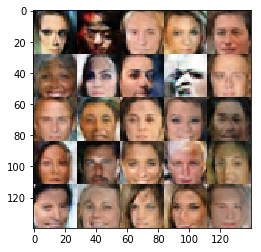

Epoch 1/ step 8750
train loss d: 1.2397329807281494/ train loss g 0.9599871039390564
Epoch 1/ step 8800
train loss d: 1.139742374420166/ train loss g 1.4417003393173218


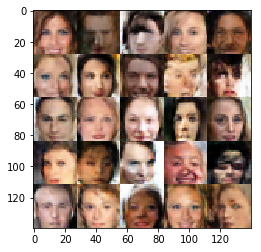

Epoch 1/ step 8850
train loss d: 1.2990272045135498/ train loss g 0.9057621955871582
Epoch 1/ step 8900
train loss d: 1.069864273071289/ train loss g 1.5113816261291504


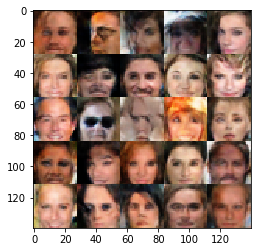

Epoch 1/ step 8950
train loss d: 1.0559636354446411/ train loss g 1.499207615852356
Epoch 1/ step 9000
train loss d: 1.190234661102295/ train loss g 1.6315464973449707


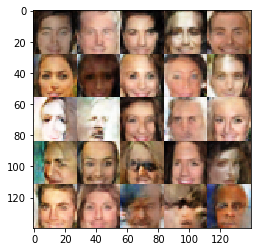

Epoch 1/ step 9050
train loss d: 1.126142978668213/ train loss g 1.6019823551177979
Epoch 1/ step 9100
train loss d: 1.2610421180725098/ train loss g 0.8591793775558472


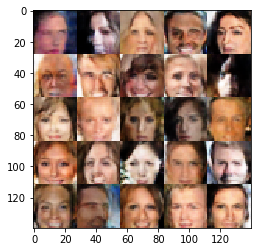

Epoch 1/ step 9150
train loss d: 1.0513153076171875/ train loss g 1.0456972122192383
Epoch 1/ step 9200
train loss d: 1.0697033405303955/ train loss g 1.4308857917785645


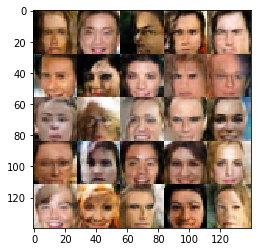

Epoch 1/ step 9250
train loss d: 1.1611323356628418/ train loss g 1.1210498809814453
Epoch 1/ step 9300
train loss d: 1.1132620573043823/ train loss g 1.4991611242294312


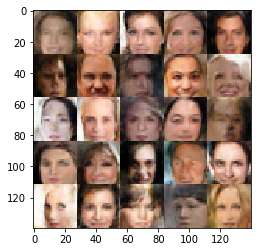

Epoch 1/ step 9350
train loss d: 1.08110511302948/ train loss g 1.1516335010528564
Epoch 1/ step 9400
train loss d: 1.1667424440383911/ train loss g 1.6886061429977417


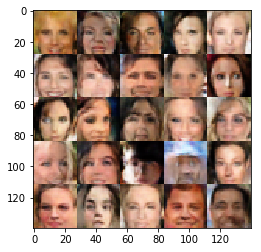

Epoch 1/ step 9450
train loss d: 1.139365792274475/ train loss g 1.4524043798446655
Epoch 1/ step 9500
train loss d: 1.0579283237457275/ train loss g 1.7006545066833496


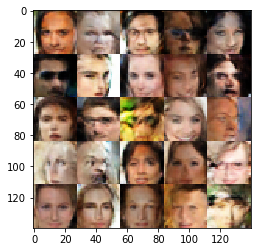

Epoch 1/ step 9550
train loss d: 1.4122902154922485/ train loss g 1.9309661388397217
Epoch 1/ step 9600
train loss d: 1.1465599536895752/ train loss g 0.9720767736434937


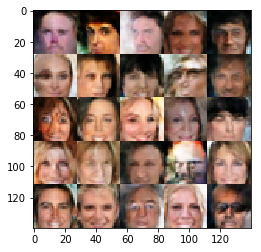

Epoch 1/ step 9650
train loss d: 1.1022672653198242/ train loss g 1.2586817741394043
Epoch 1/ step 9700
train loss d: 0.9435193538665771/ train loss g 2.242339611053467


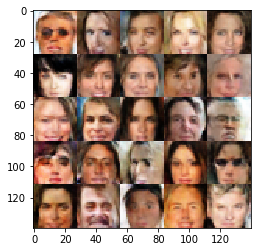

Epoch 1/ step 9750
train loss d: 1.0273103713989258/ train loss g 1.7744100093841553
Epoch 1/ step 9800
train loss d: 1.1821174621582031/ train loss g 1.2385280132293701


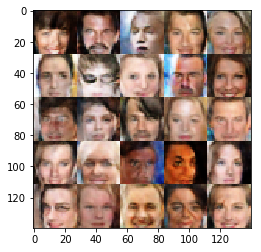

Epoch 1/ step 9850
train loss d: 1.3291125297546387/ train loss g 0.8512135744094849
Epoch 1/ step 9900
train loss d: 1.4833229780197144/ train loss g 0.8607169389724731


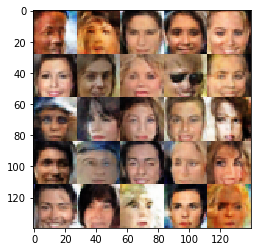

Epoch 1/ step 9950
train loss d: 1.0351866483688354/ train loss g 1.1103249788284302
Epoch 1/ step 10000
train loss d: 1.0871059894561768/ train loss g 1.9019904136657715


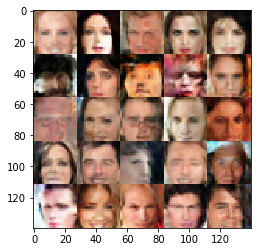

Epoch 1/ step 10050
train loss d: 1.1818559169769287/ train loss g 1.04374361038208
Epoch 1/ step 10100
train loss d: 0.9804399609565735/ train loss g 0.8446166515350342


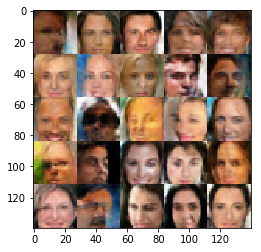

Epoch 1/ step 10150
train loss d: 1.354254126548767/ train loss g 1.443284034729004
Epoch 1/ step 10200
train loss d: 1.3094074726104736/ train loss g 1.7850337028503418


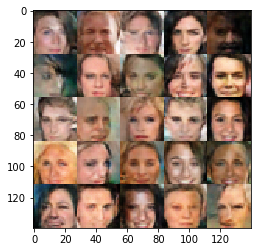

Epoch 1/ step 10250
train loss d: 1.0655102729797363/ train loss g 0.8875446319580078
Epoch 1/ step 10300
train loss d: 0.7840731143951416/ train loss g 1.5244425535202026


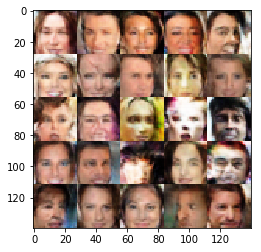

Epoch 1/ step 10350
train loss d: 1.0480923652648926/ train loss g 0.9545015096664429
Epoch 1/ step 10400
train loss d: 0.8114588260650635/ train loss g 1.7989227771759033


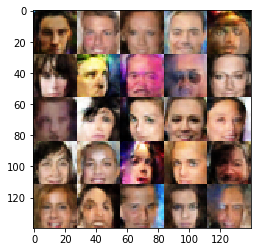

Epoch 1/ step 10450
train loss d: 1.1711901426315308/ train loss g 1.772122859954834
Epoch 1/ step 10500
train loss d: 0.7456033825874329/ train loss g 1.4606263637542725


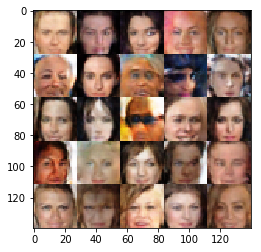

Epoch 1/ step 10550
train loss d: 1.1387981176376343/ train loss g 0.9663389325141907
Epoch 1/ step 10600
train loss d: 1.052014708518982/ train loss g 1.448992371559143


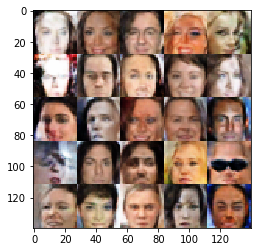

Epoch 1/ step 10650
train loss d: 1.0003610849380493/ train loss g 1.026336431503296
Epoch 1/ step 10700
train loss d: 1.1398189067840576/ train loss g 1.5200867652893066


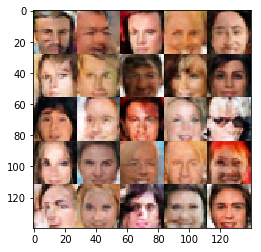

Epoch 1/ step 10750
train loss d: 1.1688477993011475/ train loss g 1.4329159259796143
Epoch 1/ step 10800
train loss d: 0.8701768517494202/ train loss g 1.2466681003570557


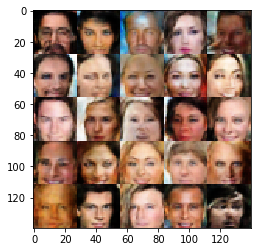

Epoch 1/ step 10850
train loss d: 0.8612730503082275/ train loss g 1.6185392141342163
Epoch 1/ step 10900
train loss d: 0.729281485080719/ train loss g 1.521647572517395


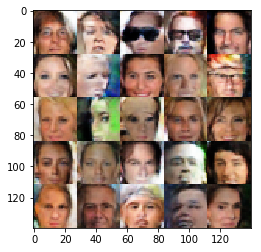

Epoch 1/ step 10950
train loss d: 1.1329255104064941/ train loss g 1.5382391214370728
Epoch 1/ step 11000
train loss d: 1.157532811164856/ train loss g 1.0727342367172241


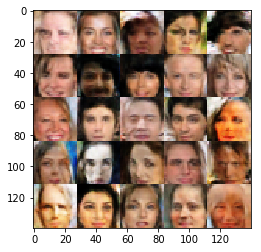

Epoch 1/ step 11050
train loss d: 0.8800769448280334/ train loss g 1.8368295431137085
Epoch 1/ step 11100
train loss d: 1.0455994606018066/ train loss g 1.065421462059021


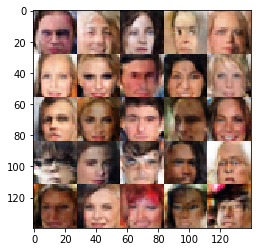

Epoch 1/ step 11150
train loss d: 1.0398716926574707/ train loss g 1.759047508239746
Epoch 1/ step 11200
train loss d: 1.0128313302993774/ train loss g 1.8558611869812012


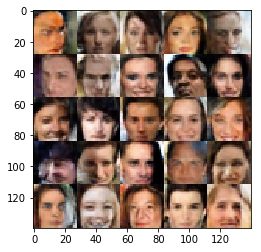

Epoch 1/ step 11250
train loss d: 0.721683919429779/ train loss g 1.6024832725524902
Epoch 1/ step 11300
train loss d: 1.211977243423462/ train loss g 1.1284034252166748


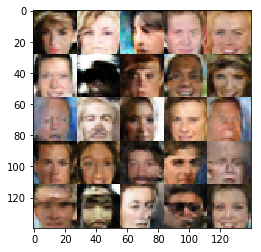

Epoch 1/ step 11350
train loss d: 0.8125843405723572/ train loss g 1.6288926601409912
Epoch 1/ step 11400
train loss d: 1.0351386070251465/ train loss g 1.9424339532852173


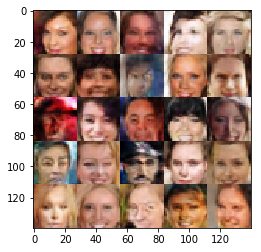

Epoch 1/ step 11450
train loss d: 0.9137614965438843/ train loss g 1.6925815343856812
Epoch 1/ step 11500
train loss d: 1.7347707748413086/ train loss g 1.9271126985549927


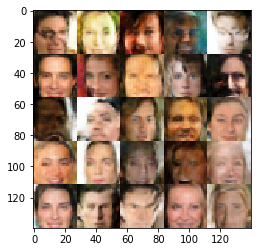

Epoch 1/ step 11550
train loss d: 1.160797357559204/ train loss g 1.0059840679168701
Epoch 1/ step 11600
train loss d: 0.9840795397758484/ train loss g 1.2780983448028564


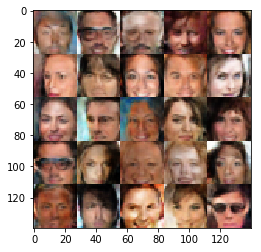

Epoch 1/ step 11650
train loss d: 1.2231611013412476/ train loss g 1.144163966178894
Epoch 1/ step 11700
train loss d: 0.9786382913589478/ train loss g 1.8476531505584717


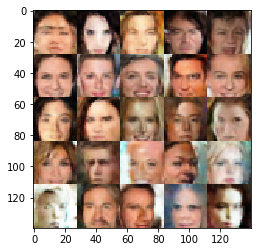

Epoch 1/ step 11750
train loss d: 1.0454301834106445/ train loss g 0.8377682566642761
Epoch 1/ step 11800
train loss d: 1.142615556716919/ train loss g 1.1530258655548096


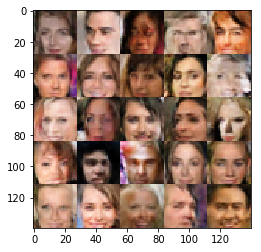

Epoch 1/ step 11850
train loss d: 0.8905269503593445/ train loss g 1.652632474899292
Epoch 1/ step 11900
train loss d: 0.900450587272644/ train loss g 1.2877305746078491


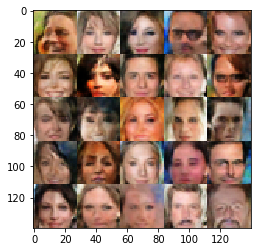

Epoch 1/ step 11950
train loss d: 1.245160698890686/ train loss g 0.9882742166519165
Epoch 1/ step 12000
train loss d: 1.2538814544677734/ train loss g 0.5690970420837402


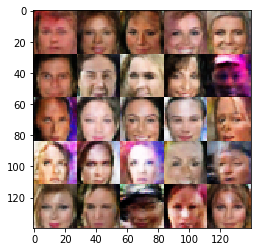

Epoch 1/ step 12050
train loss d: 0.7657464742660522/ train loss g 1.2383522987365723
Epoch 1/ step 12100
train loss d: 0.9055342674255371/ train loss g 1.3636813163757324


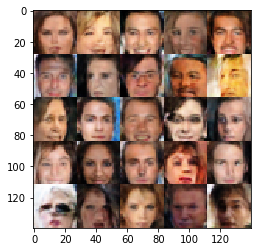

Epoch 1/ step 12150
train loss d: 0.7891507744789124/ train loss g 1.1978137493133545
Epoch 1/ step 12200
train loss d: 1.0764299631118774/ train loss g 1.1324690580368042


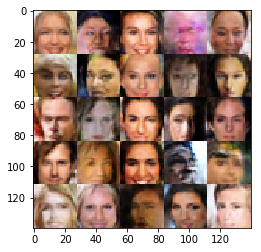

Epoch 1/ step 12250
train loss d: 0.930659830570221/ train loss g 1.8419328927993774
Epoch 1/ step 12300
train loss d: 0.856574296951294/ train loss g 1.745849609375


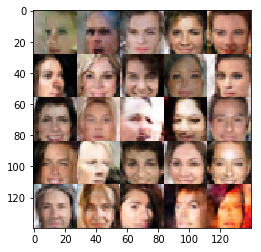

Epoch 1/ step 12350
train loss d: 0.9603011608123779/ train loss g 1.7383015155792236
Epoch 1/ step 12400
train loss d: 1.0044236183166504/ train loss g 1.155977487564087


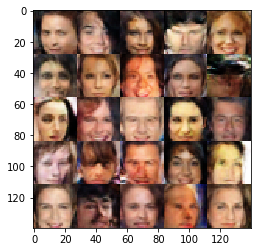

Epoch 1/ step 12450
train loss d: 1.0676876306533813/ train loss g 1.4795010089874268
Epoch 1/ step 12500
train loss d: 0.9648921489715576/ train loss g 1.720686912536621


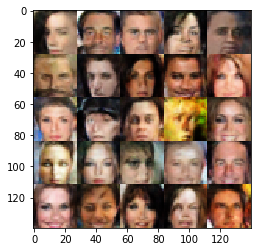

Epoch 1/ step 12550
train loss d: 0.859744668006897/ train loss g 1.2988553047180176
Epoch 1/ step 12600
train loss d: 0.8176941871643066/ train loss g 1.508124589920044


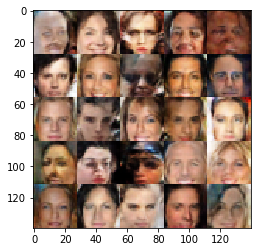

Epoch 1/ step 12650
train loss d: 0.7543596029281616/ train loss g 1.1147042512893677


In [13]:
batch_size = 32
z_dim = 110
learning_rate = 0.00025
beta1 = 0.38

epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

##### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.